In [28]:
pip install librosa

In [1]:
pip install pydub

Note: you may need to restart the kernel to use updated packages.


In [32]:
pip install librosa audioread


Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
from pydub import AudioSegment
from scipy.signal import medfilt
from scipy.spatial.distance import euclidean

In [2]:
scale_file = "audio/scale.wav"
debussy_file = "audio/debussy.wav"
redhot_file = "audio/redhot.wav"
duke_file = "audio/duke.wav"
acoustic_file = "audio/Nurawani Oya (Acoustic).mp3"
original_song = "audio/Vocals of original song.mp3"
user_song = "audio/Vocals of user.mp3"

In [3]:
ipd.Audio(original_song)

In [4]:
ipd.Audio(user_song)

In [5]:
ipd.Audio(debussy_file)

In [11]:
ipd.Audio(redhot_file)

In [63]:
ipd.Audio(acoustic_file)

In [5]:
#load audio files with librosa


scale, sr = librosa.load(scale_file)
debussy, _ = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _ = librosa.load(duke_file)
acoustic, _ = librosa.load(acoustic_file)
original_s, _ = librosa.load(original_song)
user_s, _ = librosa.load(user_song)

In [6]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [7]:
S_scale = librosa.stft(scale, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_acoustic = librosa.stft(acoustic, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_original = librosa.stft(original_s, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_user = librosa.stft(user_s, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [8]:
S_scale.shape #First dimension relative to frequancy (0.5(frame_size)+1 = 1025)
# Second dimesnsion ---> number of frames

(1025, 342)

In [9]:
S_acoustic.shape

(1025, 7556)

In [10]:
S_scale.shape

(1025, 342)

In [11]:
S_original.shape

(1025, 6422)

In [73]:
#Calculate the Spectogram 
y_scale = np.abs(S_scale) ** 2
y_acoustic = np.abs(S_acoustic) ** 2
y_original = np.abs(S_original) ** 2
y_user = np.abs(S_user) ** 2

In [74]:
y_user.shape

(1025, 5992)

In [12]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y, 
                             sr=sr, 
                             hop_length=hop_length, 
                             x_axis="time", 
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f") #map colors into different inseties

In [13]:
plot_spectrogram(y_original, sr, HOP_SIZE)

NameError: name 'y_original' is not defined

In [ ]:
y_log_original = librosa.power_to_db(y_original)
plot_spectrogram(y_log_original, sr, HOP_SIZE) #log amplitude spectogram

In [14]:
plot_spectrogram(y_log_scale, sr, HOP_SIZE, y_axis="log")

NameError: name 'y_log_scale' is not defined

In [15]:
y_log_acoustic = librosa.power_to_db(y_acoustic)
plot_spectrogram(y_log_acoustic, sr, HOP_SIZE, y_axis="log")

NameError: name 'y_acoustic' is not defined

In [16]:
OS = np.abs(librosa.stft(original_s))
US = np.abs(librosa.stft(user_s))

In [17]:
frequency_distribution_original = np.sum(OS, axis=1)
frequency_distribution_user = np.sum(US, axis=1)

In [18]:
frequency_axis = librosa.fft_frequencies(sr=sr)
frequency_axis

array([0.00000000e+00, 1.07666016e+01, 2.15332031e+01, ...,
       1.10034668e+04, 1.10142334e+04, 1.10250000e+04])

In [19]:
plt.figure(figsize=(16, 4))

<Figure size 1600x400 with 0 Axes>

<Figure size 1600x400 with 0 Axes>

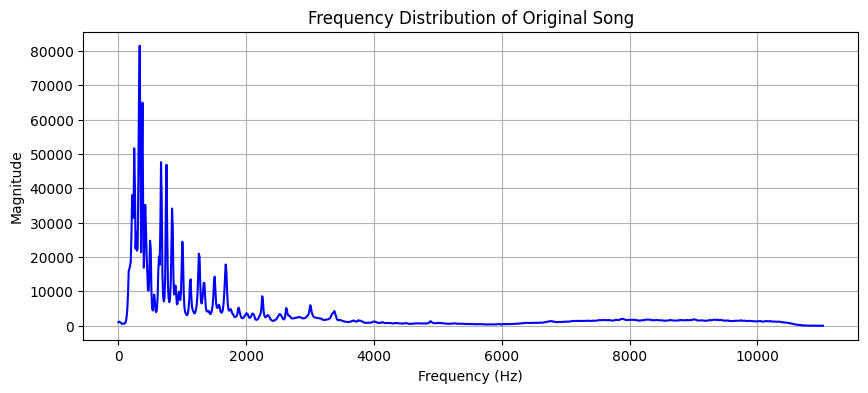

In [20]:
plt.figure(figsize=(10, 4))
plt.plot(frequency_axis, frequency_distribution_original, color='b')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Distribution of Original Song')
plt.grid(True)
plt.show()

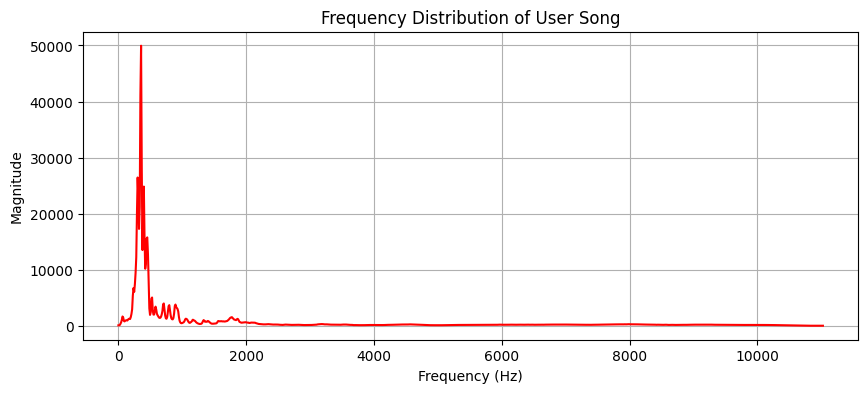

In [21]:
plt.figure(figsize=(10, 4))
plt.plot(frequency_axis, frequency_distribution_user, color='r')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Distribution of User Song')
plt.grid(True)
plt.show()

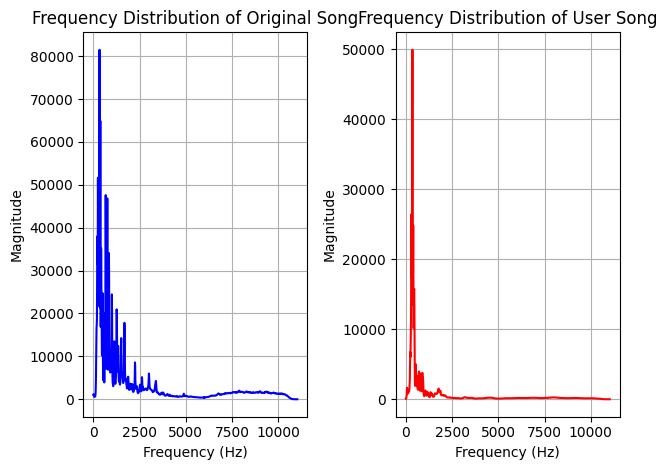

In [22]:

# Plot the frequency distribution of the original song on the left
plt.subplot(1, 2, 1)
plt.plot(frequency_axis, frequency_distribution_original, color='b')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Distribution of Original Song')
plt.grid(True)

# Plot the frequency distribution of the user song on the right
plt.subplot(1, 2, 2)
plt.plot(frequency_axis, frequency_distribution_user, color='r')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Distribution of User Song')
plt.grid(True)

# Adjust spacing between subplots
plt.tight_layout()

# Show the figure with both plots side by side
plt.show()

In [23]:
variance1 = np.var(original_s)
variance2 = np.var(user_s)

print("Variance of Original Song: ", variance1)
print("Variance of User's Song: ", variance2)

Variance of Original Song:  0.015141793
Variance of User's Song:  0.0028468298


In [29]:
original_s.shape

(3287677,)

- Convert to WAV Formats

In [25]:
#original_path = "audio/Vocals of original song.mp3"
original_path = "C:/KDU/Semester Notes/Sixth Semester/Independent Study\AI-Driven Voice Matching and Personalized Singing Improvement System/Development/audio/Vocals of original song.mp3"
#user_path = 'audio/Vocals of user.mp3'

original = AudioSegment.from_mp3(original_path)
#user = AudioSegment.from_mp3(user_path)

In [30]:
Original_ = arr.flatten(S_original)
User_ = arr.flatten(S_user)
euclidean_distance = euclidean(Original_, User_)

NameError: name 'arr' is not defined

In [31]:
S_original.shape

(1025, 6422)

In [32]:
S_user.shape

(1025, 5992)